#### Task
`Design a logic/algorithm/ML model to differentiate between Horizontal and Vertical cars (cars that have been rotated by 90 degree). The attached dataset contains such photos.Your proposed solution should be agnostic to the image resolution and aspect ratio.`

In [ ]:
from google.colab import drive

# Mount your Google Drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
root = '/content/drive/MyDrive/DEEP_LEARNNING_2023/CNN_Problem'
os.chdir(root)
os.getcwd()

'/content/drive/MyDrive/DEEP_LEARNNING_2023/CNN_Problem'

In [ ]:
import os
import cv2

def load_dataset(image_dir, mask_dir):
    image_data = []
    mask_data = []

    image_files = os.listdir(image_dir)

    for filename in image_files:
        if filename.endswith(".jpg"):  # Assuming color images are in JPG format
            image_path = os.path.join(image_dir, filename)
            mask_filename = filename.replace(".jpg", ".png")
            mask_path = os.path.join(mask_dir, mask_filename)

            color_image = cv2.imread(image_path)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            if color_image is not None and mask is not None:
                image_data.append(color_image)
                mask_data.append(mask)
            else:
                print("Error loading image or mask:", filename)

    return image_data, mask_data
import os
mask_path = '/content/drive/MyDrive/DEEP_LEARNNING_2023/CNN_Problem/dataset/Mask'
image_path = '/content/drive/MyDrive/DEEP_LEARNNING_2023/CNN_Problem/dataset/Image'

image_data, mask_data = load_dataset(image_dir=image_path,mask_dir=mask_path)

In [ ]:
print(f"image data length :{len(image_data)}")
print(f"mask data length :{len(mask_data)}")


image data length :20
mask data length :20


### **visualize the given data**

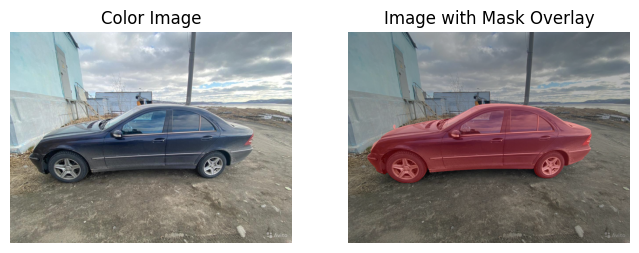

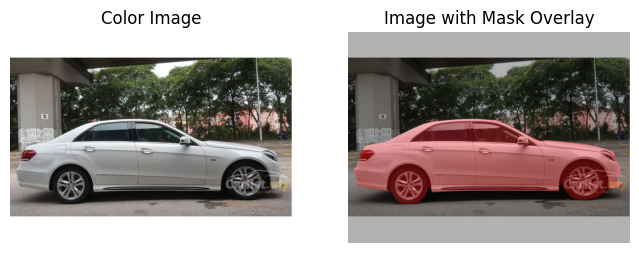

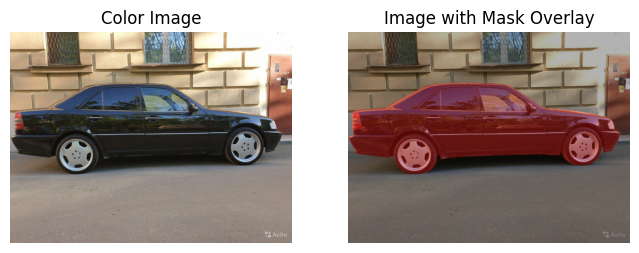

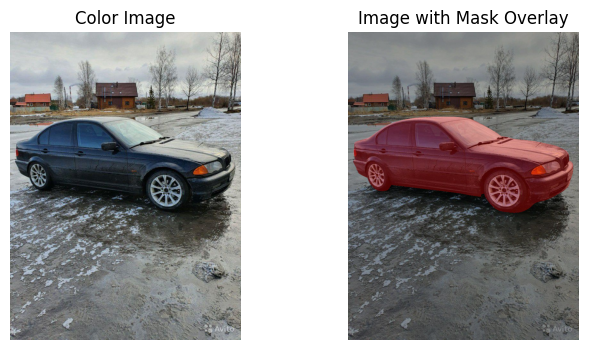

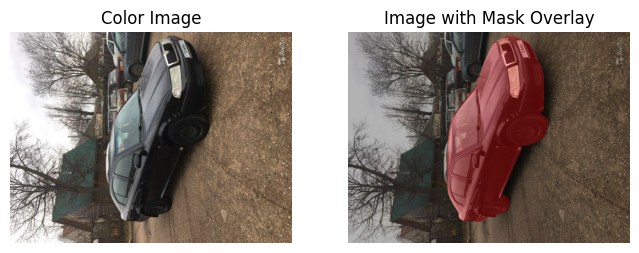

...

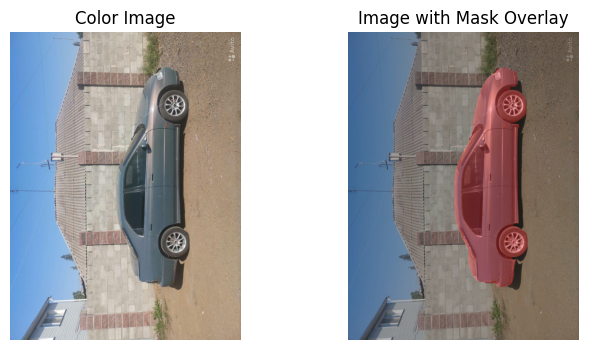

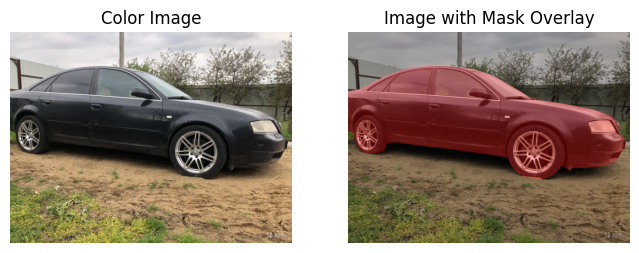

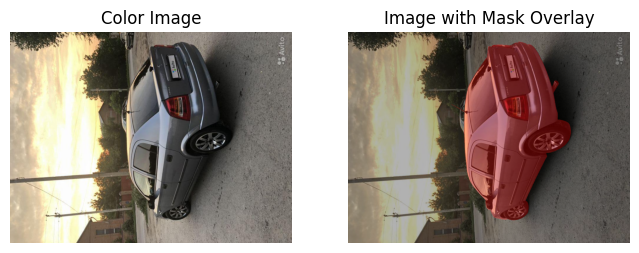

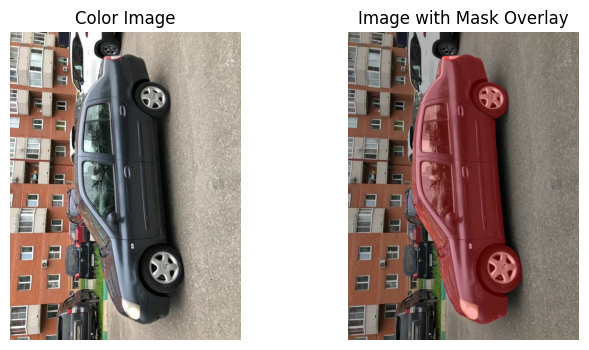

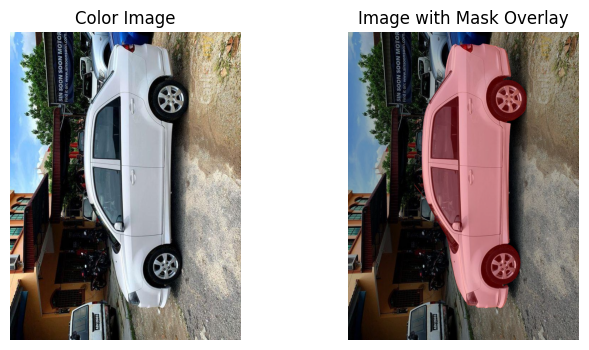

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def visualize_image_with_mask(images, masks):

    num_samples = len(images)

    for i in range(num_samples):
        # Convert the mask to a color image for overlay
        mask_color = cv2.cvtColor(masks[i], cv2.COLOR_GRAY2BGR)
        mask_color[np.where((mask_color == [255, 255, 255]).all(axis=2))] = [0, 0, 255]  # Set mask color (red)

        # Overlay the mask on the color image
        overlaid_image = cv2.addWeighted(images[i], 0.7, mask_color, 0.3, 0)

        # Plot the overlaid image
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title("Color Image")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(overlaid_image, cv2.COLOR_BGR2RGB))
        plt.title("Image with Mask Overlay")
        plt.axis("off")

        plt.show()

visualize_image_with_mask(image_data, mask_data)


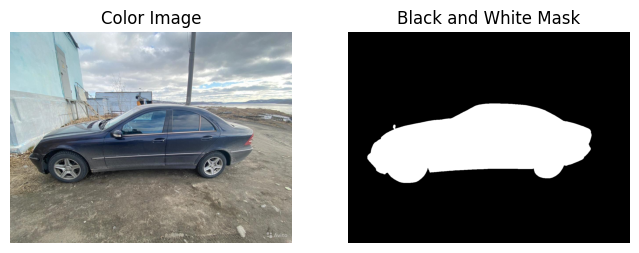

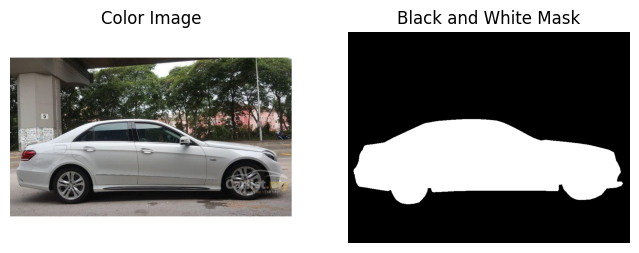

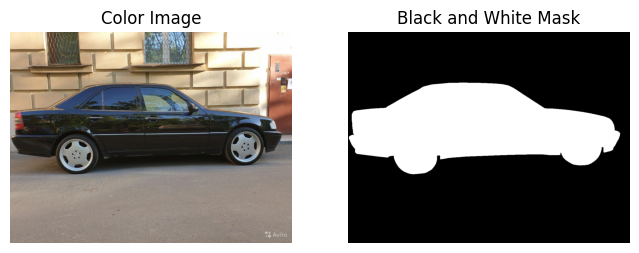

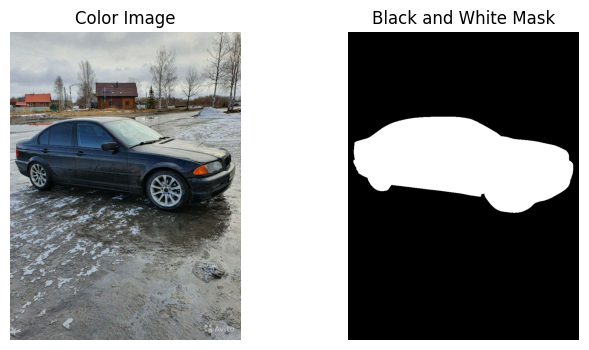

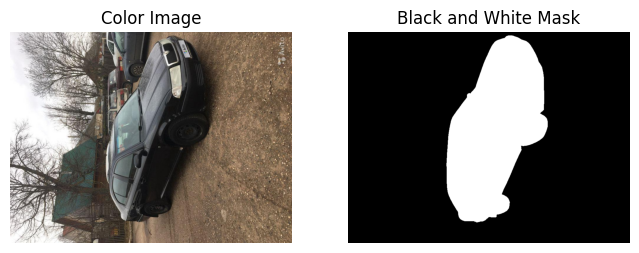

...

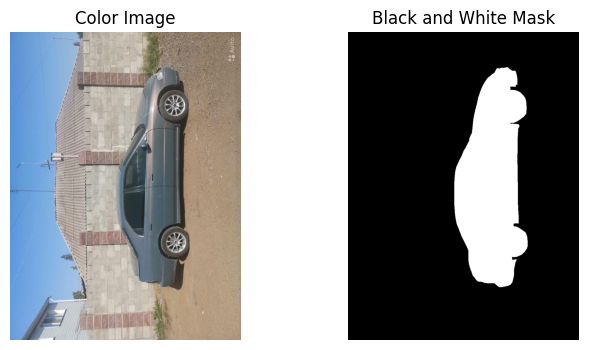

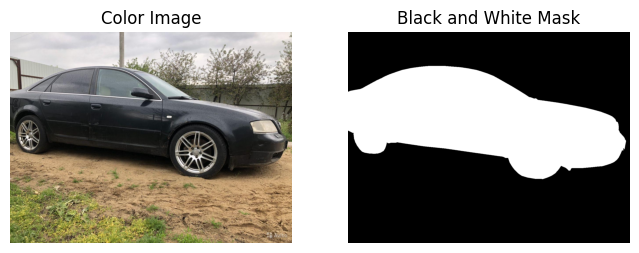

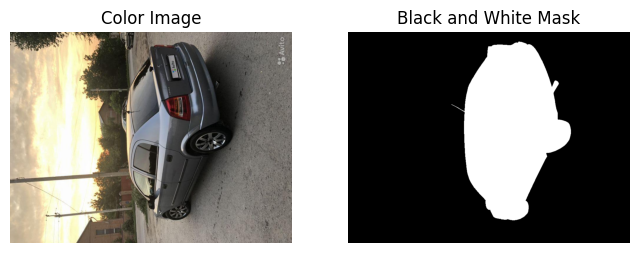

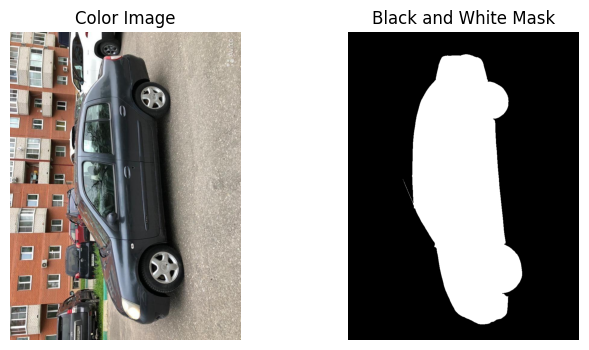

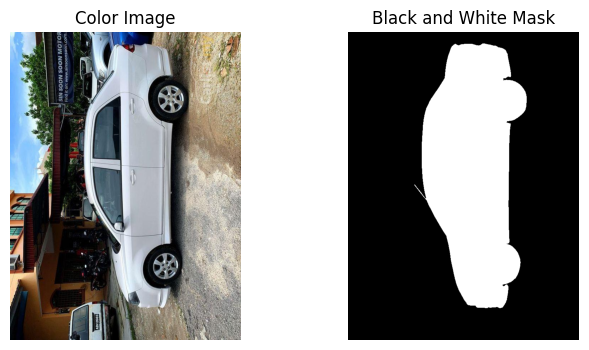

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def visualize_image_with_mask(images, masks):

    num_samples = len(images)

    for i in range(num_samples):
        # Ensure that the mask has the same dimensions as the color image
        mask_resized = cv2.resize(masks[i], (images[i].shape[1], images[i].shape[0]), interpolation=cv2.INTER_NEAREST)

        # Overlay the black and white mask on the color image
        overlaid_image = cv2.addWeighted(images[i], 0.7, cv2.cvtColor(mask_resized, cv2.COLOR_GRAY2BGR), 0.3, 0)

        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title("Color Image")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(mask_resized, cmap="gray")
        plt.title("Black and White Mask")
        plt.axis("off")

        plt.show()

visualize_image_with_mask(image_data, mask_data)


### we have a small dataset 20 images like this is prone to overfitting
` So for this resion i have to do the `

**Data Augmentation:** Data augmentation techniques can help you artificially increase the size of your dataset by generating new training examples with variations. Common augmentations for image data include rotation, flipping, zooming, and changing brightness/contrast. Data augmentation can help the model learn more robust features and reduce overfitting

In [ ]:
def augment_dataset(image_data, mask_data,dir, num_samples):

    augmented_image_dir = os.path.join(dir, "AugmentedImage")
    augmented_mask_dir = os.path.join(dir, "AugmentedMask")
    os.makedirs(augmented_image_dir, exist_ok=True)
    os.makedirs(augmented_mask_dir, exist_ok=True)

    num_original_samples = len(image_data)
    num_augmented_samples = 0

    while num_augmented_samples < num_samples:
        # Randomly select an original image-mask pair
        random_index = np.random.randint(num_original_samples)
        original_image = image_data[random_index]
        original_mask = mask_data[random_index]

        # Apply random transformations (e.g., rotation, flipping)
        angle = np.random.randint(360)  # Random angle between 0 and 359 degrees
        scale = np.random.uniform(0.8, 1.2)  # Random scale between 0.8 and 1.2
        flip_horizontal = np.random.choice([True, False])  # Random horizontal flipping

        # Perform image transformations
        transformed_image = original_image.copy()
        transformed_image = cv2.resize(transformed_image, None, fx=scale, fy=scale)
        transformed_image = cv2.rotate(transformed_image, cv2.ROTATE_90_CLOCKWISE)
        if flip_horizontal:
            transformed_image = cv2.flip(transformed_image, 1)  # Horizontal flip

        # Perform mask transformations
        transformed_mask = original_mask.copy()
        transformed_mask = cv2.resize(transformed_mask, None, fx=scale, fy=scale)
        transformed_mask = cv2.rotate(transformed_mask, cv2.ROTATE_90_CLOCKWISE)
        if flip_horizontal:
            transformed_mask = cv2.flip(transformed_mask, 1)  # Horizontal flip

        # Generate a unique integer filename
        file_number = num_augmented_samples
        augmented_image_filename = os.path.join(augmented_image_dir, f"{file_number}.jpg")
        augmented_mask_filename = os.path.join(augmented_mask_dir, f"{file_number}.png")

        # Save the augmented image and mask
        cv2.imwrite(augmented_image_filename, transformed_image)
        cv2.imwrite(augmented_mask_filename, transformed_mask)

        num_augmented_samples += 1

if __name__ == "__main__":
    mask_path = '/content/drive/MyDrive/DEEP_LEARNNING_2023/CNN_Problem/dataset/Mask'
    image_path = '/content/drive/MyDrive/DEEP_LEARNNING_2023/CNN_Problem/dataset/Image'

    image_data, mask_data = load_dataset(image_dir=image_path,mask_dir=mask_path)
    image_data = image_data
    mask_data = mask_data
    dir = "/content/drive/MyDrive/DEEP_LEARNNING_2023/CNN_Problem/dataset"


    num_samples = 250

    augment_dataset(image_data, mask_data, dir, num_samples)


In [ ]:
aug_img= '/content/drive/MyDrive/DEEP_LEARNNING_2023/CNN_Problem/dataset/AugmentedImage'
aug_mask = '/content/drive/MyDrive/DEEP_LEARNNING_2023/CNN_Problem/dataset/AugmentedMask'
aug_img,aug_mask = load_dataset(aug_img, aug_mask)


In [ ]:
print(len(aug_img))
print(len(aug_mask))

250
250


**Image Preprocessing Function->**

The "Image Preprocessing Function" is a Python code snippet designed to prepare input images and corresponding masks for computer vision tasks. It performs a series of essential operations on the data to ensure uniformity and compatibility with machine learning models. The key steps in this preprocessing function are as follows:

1. **Resizing**:
   - The function resizes the input images and masks to a predefined target shape (e.g., 224x224 pixels). This resizing is performed using the `transform.resize` function from the `skimage` library, with the "reflect" mode and anti-aliasing enabled. Resizing ensures that all images have consistent dimensions, a requirement for many machine learning models.

2. **Mask Conversion**:
   - The function converts the masks into a binary format, where pixel values greater than 0.5 are set to 1, and those less than or equal to 0.5 are set to 0. This binary representation is commonly used in tasks like image segmentation.

3. **Adding Channels**:
   - To match the typical format used in deep learning frameworks, the function adds a single channel dimension to the masks. This step ensures that the masks have the appropriate shape for model compatibility.

4. **Data Structuring**:
   - The preprocessed images and masks are organized into lists: `preprocessed_images` and `preprocessed_masks`. This structured data can be easily fed into machine learning models for training and evaluation.

5. **Output**:
   - The preprocessing function returns the preprocessed images and masks as NumPy arrays, ready for use in various computer vision tasks.

Overall, this image preprocessing function is a crucial step in the data preparation pipeline, ensuring that input data is appropriately formatted and tailored to the requirements of machine learning and computer vision models.

In [ ]:
import numpy as np
from skimage import transform

def preprocess_data(image_data, mask_data, target_shape):
    preprocessed_images = []
    preprocessed_masks = []

    for image, mask in zip(image_data, mask_data):
        # Resize the image to the target shape
        image = transform.resize(image, target_shape, mode='reflect', anti_aliasing=True)

        # Resize the mask to the target shape
        mask = transform.resize(mask, target_shape, mode='reflect', anti_aliasing=True)

        # Convert the mask to binary format (0 or 1)
        mask = (mask > 0.5).astype(np.uint8)

        # Add a single channel dimension to the mask
        mask = np.expand_dims(mask, axis=-1)

        preprocessed_images.append(image)
        preprocessed_masks.append(mask)

    return np.array(preprocessed_images), np.array(preprocessed_masks)

target_shape = (224, 224)

preprocessed_aug_img, preprocessed_aug_mask = preprocess_data(aug_img, aug_mask, target_shape)




In [ ]:
preprocessed_aug_img

array([[[[0.61666624, 0.71862702, 0.78529369],
         [0.60702878, 0.70898956, 0.77565623],
         [0.60050645, 0.70246723, 0.7691339 ],
         ...,
         [0.20721477, 0.2616001 , 0.25367721],
         [0.15225134, 0.1984163 , 0.19059092],
         [0.14655013, 0.18969114, 0.18186609]],

        [[0.60061792, 0.70257871, 0.76924538],
         [0.59792207, 0.69988285, 0.76654952],
         [0.59529157, 0.69725236, 0.76391902],
         ...,
         [0.17638645, 0.23043579, 0.22441233],
         [0.14234855, 0.18705146, 0.18225288],
         [0.18487425, 0.22648848, 0.22175495]],

        [[0.58375781, 0.68574285, 0.75239335],
         [0.59192899, 0.69391403, 0.76056453],
         [0.58845351, 0.69043855, 0.75708905],
         ...,
         [0.11425033, 0.1657728 , 0.16906057],
         [0.13928057, 0.18011821, 0.18599647],
         [0.23342255, 0.27060147, 0.27731261]],

        ...,

        [[0.43913564, 0.4587655 , 0.4940061 ],
         [0.44933025, 0.46896011, 0.5042007 ]

In [ ]:
preprocessed_aug_mask


array([[[[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        ...,

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]]],


       [[[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        [[0],
         [0],
         [0],
         ...,
         [0],
         [0],
         [0]],

        ...,

        [[0],
         [0],
         [0],
         ...,
         [0],


### Spliting the data into train and test

In [ ]:
from sklearn.model_selection import train_test_split

def split_dataset(images, masks, validation_split=0.2, random_state=None):

    train_images, val_images, train_masks, val_masks = train_test_split(
        images, masks, test_size=validation_split, random_state=random_state
    )

    return train_images, val_images, train_masks, val_masks

train_images, val_images, train_masks, val_masks = split_dataset(preprocessed_aug_img, preprocessed_aug_mask)

print("Training images shape:", len(train_images))
print("Validation images shape:", len(val_images))
print("Training masks shape:", len(train_masks))
print("Validation masks shape:", len(val_masks))


Training images shape: 200
Validation images shape: 50
Training masks shape: 200
Validation masks shape: 50


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate, BatchNormalization, Activation

def U2Net(input_shape):
    inputs = Input(input_shape)

    # Contracting Path
    conv1 = Conv2D(32, 3, padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Activation('relu')(conv1)
    conv1 = Conv2D(32, 3, padding='same')(conv1)
    conv1 = BatchNormalization()(conv1)
    conv1 = Activation('relu')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, 3, padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Activation('relu')(conv2)
    conv2 = Conv2D(64, 3, padding='same')(conv2)
    conv2 = BatchNormalization()(conv2)
    conv2 = Activation('relu')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, 3, padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Activation('relu')(conv3)
    conv3 = Conv2D(128, 3, padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    conv3 = Activation('relu')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = Conv2D(256, 3, padding='same')(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Activation('relu')(conv4)
    conv4 = Conv2D(256, 3, padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    conv4 = Activation('relu')(conv4)

    # Expansive Path
    up5 = UpSampling2D(size=(2, 2))(conv4)
    up5 = Conv2D(128, 2, padding='same')(up5)
    up5 = BatchNormalization()(up5)
    up5 = Activation('relu')(up5)
    merge5 = Concatenate(axis=3)([conv3, up5])
    conv5 = Conv2D(128, 3, padding='same')(merge5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Activation('relu')(conv5)
    conv5 = Conv2D(128, 3, padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Activation('relu')(conv5)

    up6 = UpSampling2D(size=(2, 2))(conv5)
    up6 = Conv2D(64, 2, padding='same')(up6)
    up6 = BatchNormalization()(up6)
    up6 = Activation('relu')(up6)
    merge6 = Concatenate(axis=3)([conv2, up6])
    conv6 = Conv2D(64, 3, padding='same')(merge6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Activation('relu')(conv6)
    conv6 = Conv2D(64, 3, padding='same')(conv6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Activation('relu')(conv6)

    up7 = UpSampling2D(size=(2, 2))(conv6)
    up7 = Conv2D(32, 2, padding='same')(up7)
    up7 = BatchNormalization()(up7)
    up7 = Activation('relu')(up7)
    merge7 = Concatenate(axis=3)([conv1, up7])
    conv7 = Conv2D(32, 3, padding='same')(merge7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Activation('relu')(conv7)
    conv7 = Conv2D(32, 3, padding='same')(conv7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Activation('relu')(conv7)

    # Output Layer
    output = Conv2D(1, 1, activation='sigmoid')(conv7)

    model = tf.keras.Model(inputs=inputs, outputs=output)
    return model

# Specify the input shape
input_shape = (224, 224, 3)

# Create the smaller U2-Net model
modelu2 = U2Net(input_shape)

# Compile the model
modelu2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display the model summary
modelu2.summary()


Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_77 (Conv2D)             (None, 224, 224, 32  896         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 224, 224, 32  128        ['conv2d_77[0][0]']              
 alization)                     )                                                           

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Train the model on the training set with early stopping
history = modelu2.fit(
    train_images, train_masks,
    epochs=20,
    batch_size=16,
    validation_data=(val_images, val_masks),
    callbacks=[early_stopping]  # Add the early stopping callback
)

# Evaluate the model
results = modelu2.evaluate(val_images, val_masks)
print("Validation loss:", results[0])
print("Validation accuracy:", results[1])


Epoch 1/20
 5/13 [==========>...................] - ETA: 3:49 - loss: 0.6118 - accuracy: 0.6865

In [ ]:
import tensorflow as tf

In [ ]:
# Load the saved model
loaded_model = tf.keras.models.load_model('modelu2.h5')


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_predictions(images, model, num_samples=5):
    # Randomly select a few samples to visualize
    sample_indices = np.random.choice(len(images), num_samples, replace=False)

    for idx in sample_indices:
        plt.figure(figsize=(12, 6))

        # Original image
        original_image = images[idx]
        plt.subplot(1, 2, 1)
        plt.imshow(original_image)
        plt.title('Original Image')

        # Predicted mask
        input_image = np.expand_dims(original_image, axis=0)  # Add batch dimension
        predicted_mask = model.predict(input_image)[0]  # Make the prediction
        plt.subplot(1, 2, 2)
        plt.imshow(predicted_mask, cmap='gray')  # Assuming binary mask
        plt.title('Predicted Mask')

        plt.show()


### **prediction**

1/1 [==============================] - 1s 546ms/step


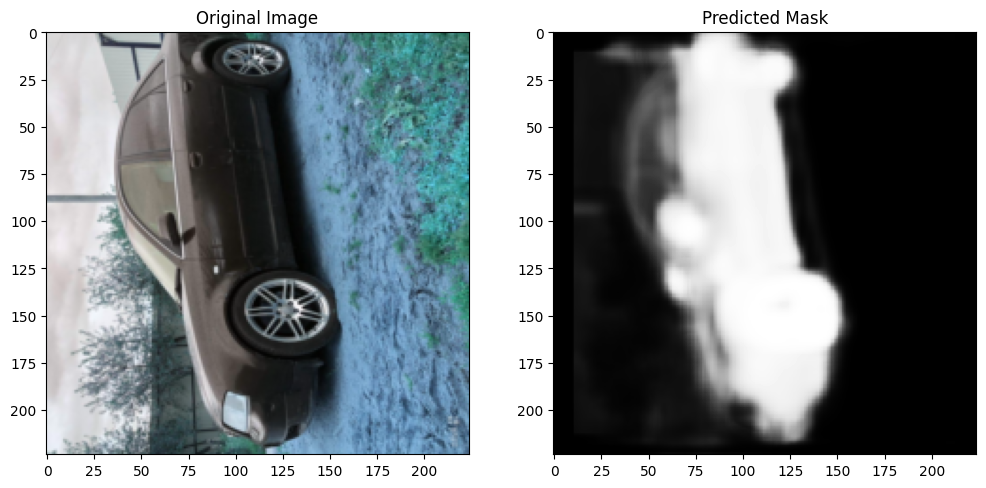

1/1 [==============================] - 0s 42ms/step


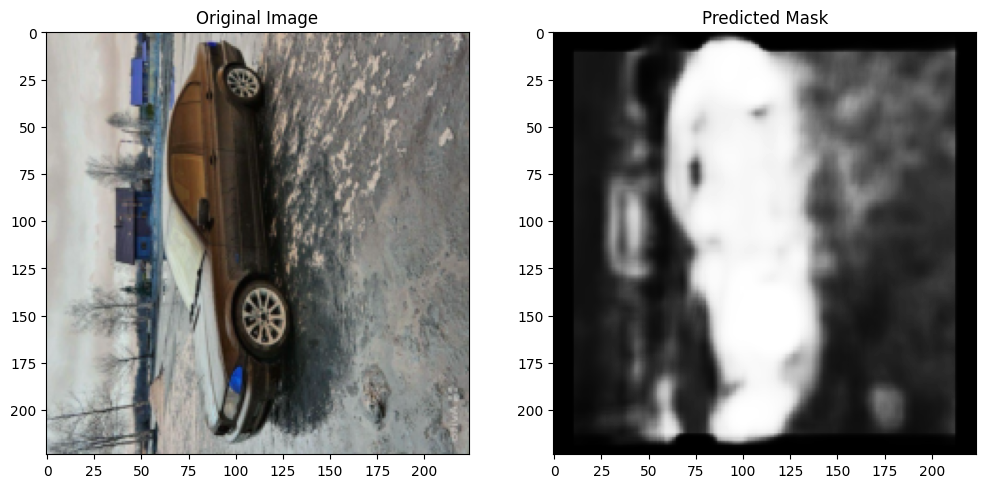

1/1 [==============================] - 0s 38ms/step


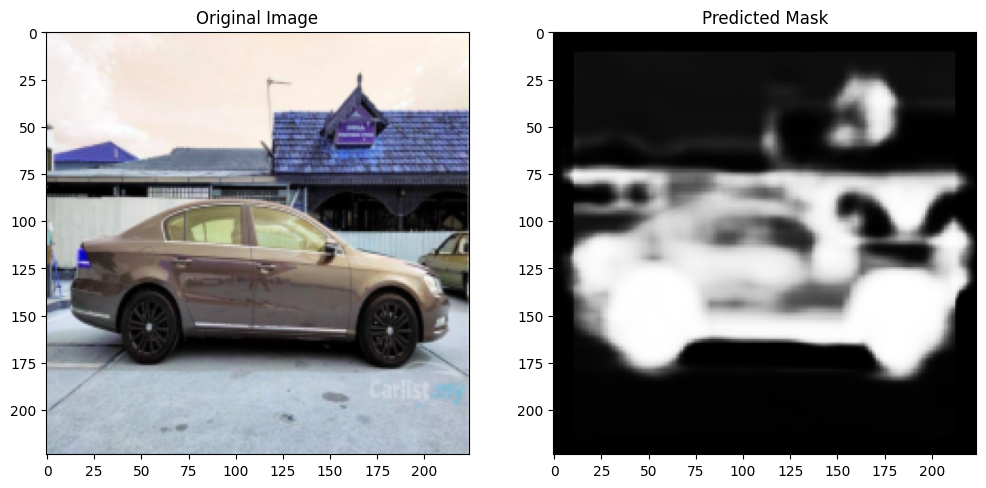

1/1 [==============================] - 0s 38ms/step


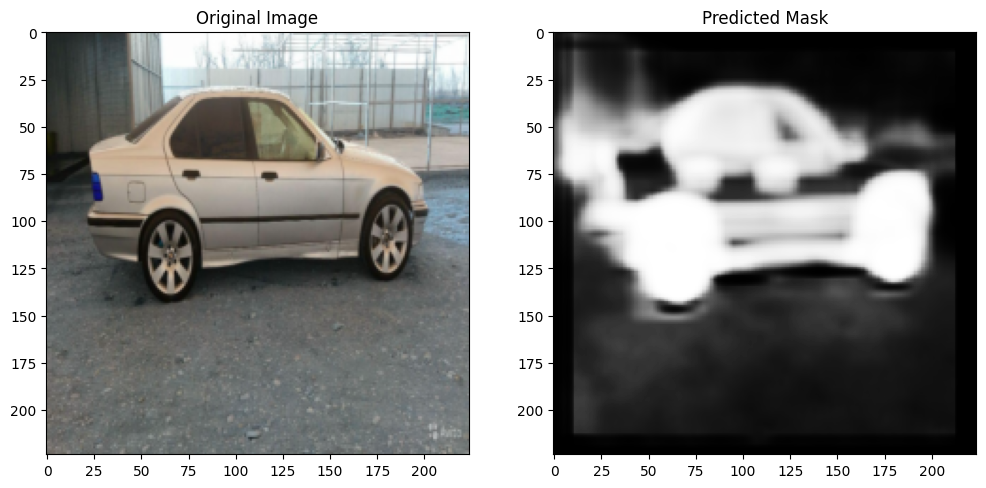

1/1 [==============================] - 0s 42ms/step


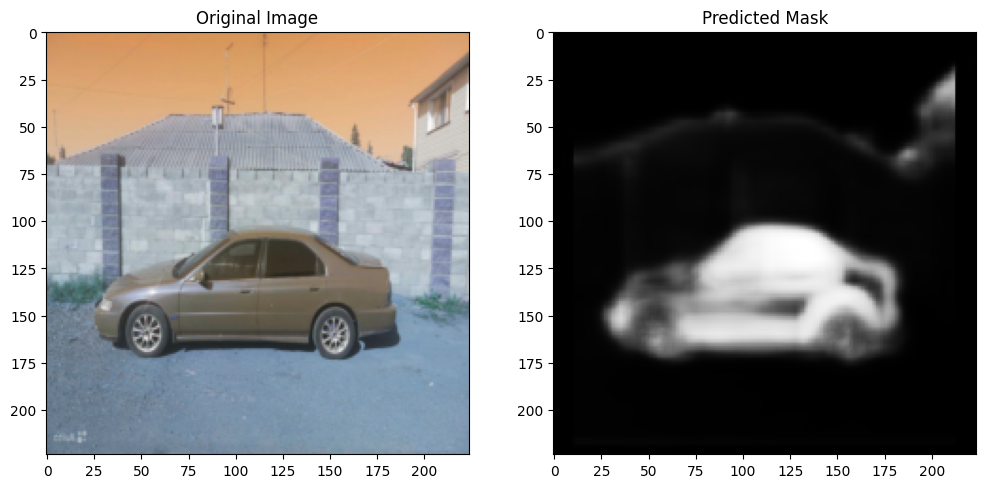

1/1 [==============================] - 0s 42ms/step


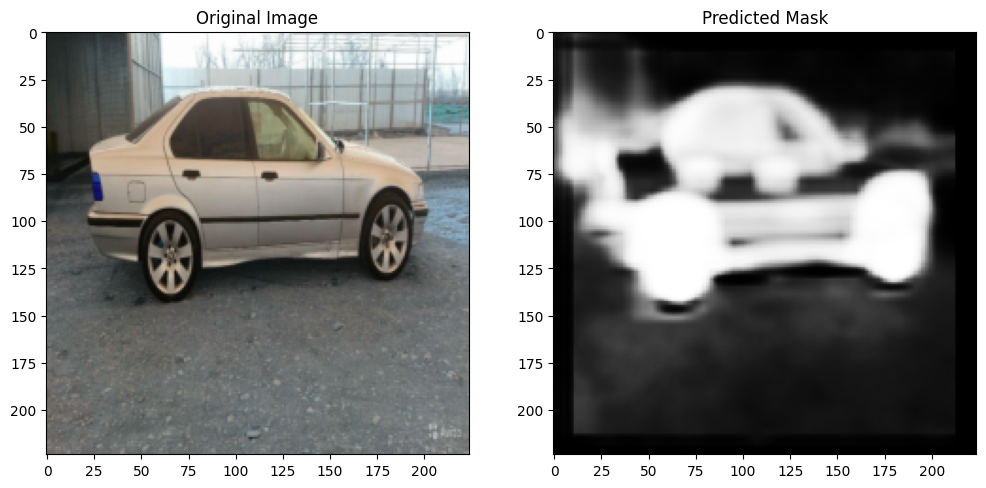

1/1 [==============================] - 0s 52ms/step


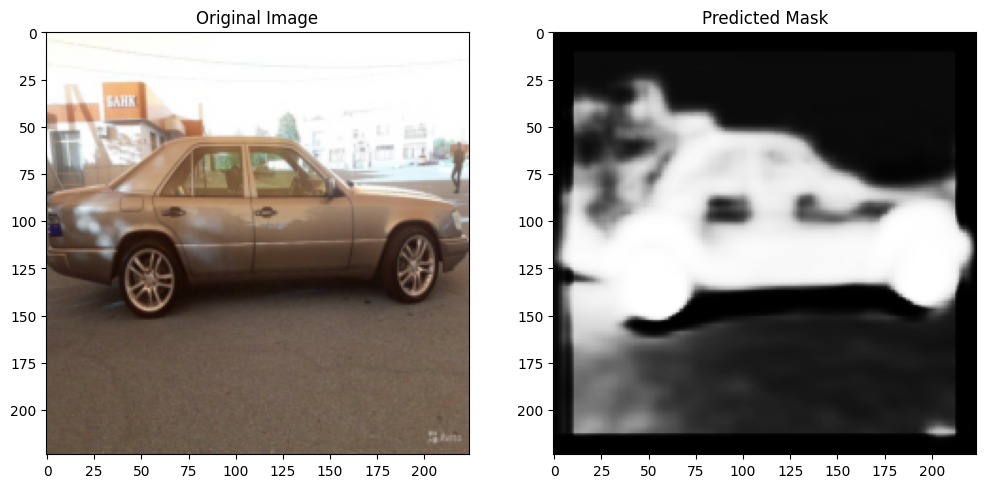

1/1 [==============================] - 0s 55ms/step


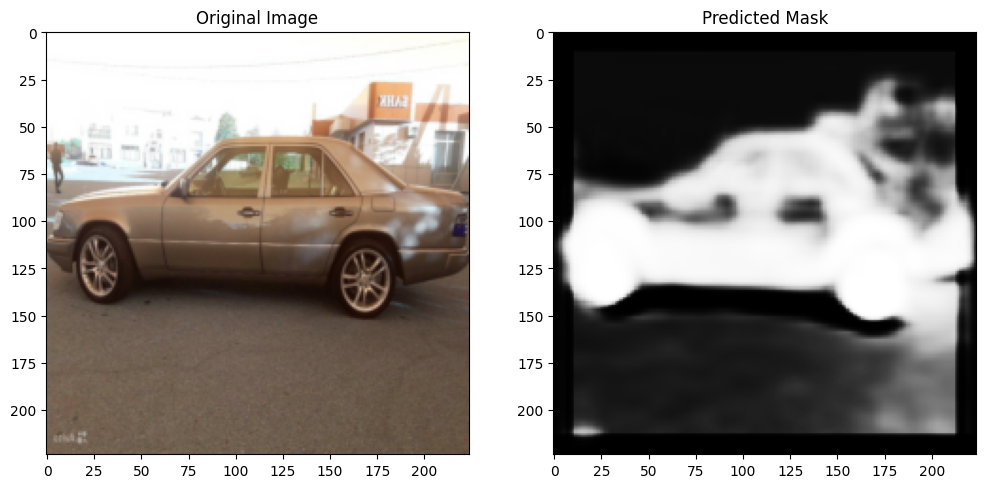

1/1 [==============================] - 0s 69ms/step


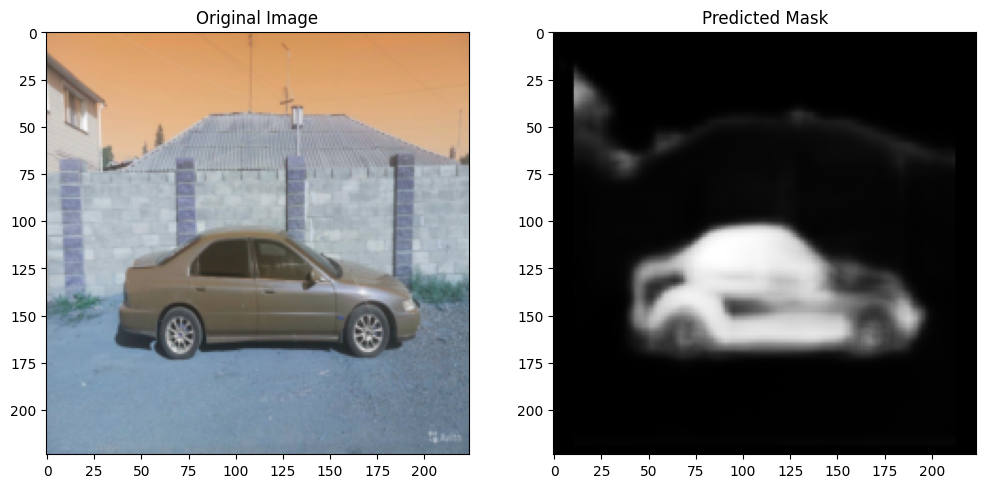

1/1 [==============================] - 0s 32ms/step


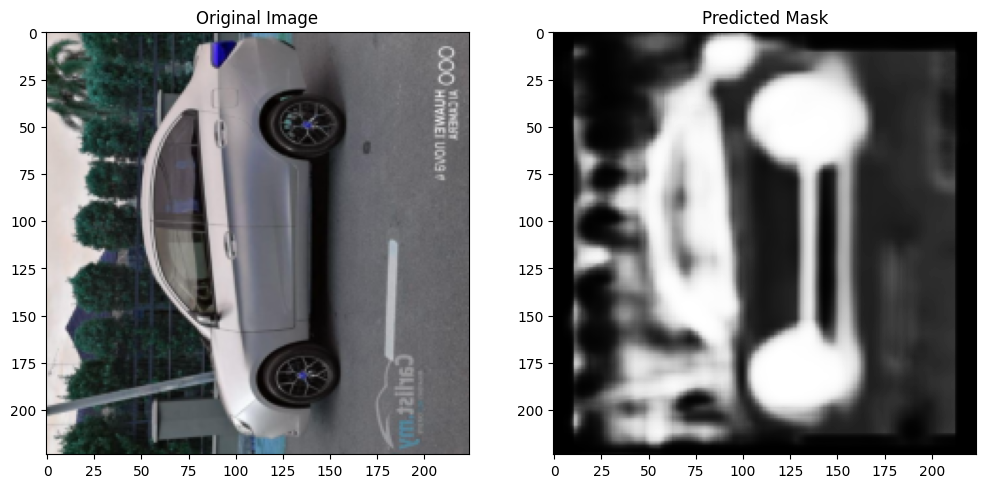

In [ ]:
visualize_predictions(val_images, loaded_model, num_samples=10)